# Stop Words

Los Stop Words son palabras que se utilizan comunmente en el armado de oraciones pero no proveen información por si mismas. Algunos ejemplos en español sería "de", "un", "la", "el" y "en".
Para evitar el almacenamientoy procesamiento extra que requieren estas palabras es común extraerlas. Para hacerlo es necesario tener acceso a una lista de aquellas palabras que se consideren stopwords en el idioma en el que estemos trabajando.

## Stop Words en inglés

In [1]:
import nltk
from nltk.corpus import stopwords
#nltk.download('punkt')
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

## Stop Words en español

In [2]:
print(stopwords.words('spanish'))

['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con', 'no', 'una', 'su', 'al', 'lo', 'como', 'más', 'pero', 'sus', 'le', 'ya', 'o', 'este', 'sí', 'porque', 'esta', 'entre', 'cuando', 'muy', 'sin', 'sobre', 'también', 'me', 'hasta', 'hay', 'donde', 'quien', 'desde', 'todo', 'nos', 'durante', 'todos', 'uno', 'les', 'ni', 'contra', 'otros', 'ese', 'eso', 'ante', 'ellos', 'e', 'esto', 'mí', 'antes', 'algunos', 'qué', 'unos', 'yo', 'otro', 'otras', 'otra', 'él', 'tanto', 'esa', 'estos', 'mucho', 'quienes', 'nada', 'muchos', 'cual', 'poco', 'ella', 'estar', 'estas', 'algunas', 'algo', 'nosotros', 'mi', 'mis', 'tú', 'te', 'ti', 'tu', 'tus', 'ellas', 'nosotras', 'vosotros', 'vosotras', 'os', 'mío', 'mía', 'míos', 'mías', 'tuyo', 'tuya', 'tuyos', 'tuyas', 'suyo', 'suya', 'suyos', 'suyas', 'nuestro', 'nuestra', 'nuestros', 'nuestras', 'vuestro', 'vuestra', 'vuestros', 'vuestras', 'esos', 'esas', 'estoy', 'estás', 'está', 'estamos', 'estáis', 'están', 'e

# Ejemplo

In [3]:
#nltk.download('punkt')
from nltk.tokenize import word_tokenize
 
example = "The Palace of Westminster serves as the meeting place for both the House of Commons and the House of Lords, the two houses of the Parliament of the United Kingdom. Informally known as the Houses of Parliament after its occupants, the Palace lies on the north bank of the River Thames in the City of Westminster, in central London, England."
# General lista de stop words 
stop_words = set(stopwords.words('english'))

# Aplicar Tokenizer
tokenized_text = word_tokenize(example)
print(tokenized_text)

['The', 'Palace', 'of', 'Westminster', 'serves', 'as', 'the', 'meeting', 'place', 'for', 'both', 'the', 'House', 'of', 'Commons', 'and', 'the', 'House', 'of', 'Lords', ',', 'the', 'two', 'houses', 'of', 'the', 'Parliament', 'of', 'the', 'United', 'Kingdom', '.', 'Informally', 'known', 'as', 'the', 'Houses', 'of', 'Parliament', 'after', 'its', 'occupants', ',', 'the', 'Palace', 'lies', 'on', 'the', 'north', 'bank', 'of', 'the', 'River', 'Thames', 'in', 'the', 'City', 'of', 'Westminster', ',', 'in', 'central', 'London', ',', 'England', '.']


In [4]:
# Crear lista sin stopwords
example_no_stopwords = [x for x in tokenized_text if not x.lower() in stop_words]
print(example_no_stopwords)

['Palace', 'Westminster', 'serves', 'meeting', 'place', 'House', 'Commons', 'House', 'Lords', ',', 'two', 'houses', 'Parliament', 'United', 'Kingdom', '.', 'Informally', 'known', 'Houses', 'Parliament', 'occupants', ',', 'Palace', 'lies', 'north', 'bank', 'River', 'Thames', 'City', 'Westminster', ',', 'central', 'London', ',', 'England', '.']


In [5]:
import requests
import os
from dotenv import load_dotenv
import pandas as pd
import string
from nltk.tokenize import TweetTokenizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
url = "https://api.twitter.com/2/tweets/search/recent"
# Cargar valores del archivo .env en las variables de entorno
load_dotenv()
# Cargar valor del token a variable
bearer_token = os.environ.get("BEARER_TOKEN")

# Ejercicio

- Obtener de la API una lista de Tweets que no sean retweet y que contengan el hashtag #football en inglés.
- Realizar la tokenización y limpieza
- Crear una nube de palabras

In [6]:
params = {
    'query': '#football  lang:en -is:retweet',
    'tweet.fields':'created_at',
    'max_results':100
}
headers = {
    "Authorization": f"Bearer {bearer_token}",
    "User-Agent":"v2FullArchiveSearchPython"
}
response = requests.get(url, headers=headers, params=params)
print(response)
# Generar excepción si la respuesta no es exitosa
if response.status_code != 200:
    raise Exception(response.status_code, response.text)
print(response.json())


<Response [200]>
{'data': [{'created_at': '2021-10-04T13:54:33.000Z', 'id': '1445024545279119366', 'text': "Demarai Gray: It's all clicking at Everton https://t.co/Pq4LYBsmNg #football #news #sport https://t.co/GexwPBjhAe"}, {'created_at': '2021-10-04T13:54:26.000Z', 'id': '1445024514937548807', 'text': "Chelsea fullback Chilwell: I've just had to be patient https://t.co/knnrYiRIhk #football #news #sport https://t.co/qConpaQ5Xp"}, {'created_at': '2021-10-04T13:54:23.000Z', 'id': '1445024503793291266', 'text': 'Brentford boss Thomas Frank: World now taking us seriously https://t.co/a0S3cmdt1e #football #news #sport https://t.co/VCTgpH9EUe'}, {'created_at': '2021-10-04T13:54:21.000Z', 'id': '1445024493336875008', 'text': 'Bielsa tells Leeds doubters: Roberts taking step forward https://t.co/FMNs5pRlxk #football #news #sport https://t.co/52LFwMDH26'}, {'created_at': '2021-10-04T13:54:18.000Z', 'id': '1445024483245379587', 'text': 'Keane unimpressed by Man City midfielder Grealish: Time to

In [7]:
df = pd.json_normalize(response.json()['data'])
df

,created_at,id,text
0,2021-10-04T13:54:33.000Z,1445024545279119366,Demarai Gray: It's all clicking at Everton htt...
1,2021-10-04T13:54:26.000Z,1445024514937548807,Chelsea fullback Chilwell: I've just had to be...
2,2021-10-04T13:54:23.000Z,1445024503793291266,Brentford boss Thomas Frank: World now taking ...
3,2021-10-04T13:54:21.000Z,1445024493336875008,Bielsa tells Leeds doubters: Roberts taking st...
4,2021-10-04T13:54:18.000Z,1445024483245379587,Keane unimpressed by Man City midfielder Greal...
...,...,...,...
95,2021-10-04T13:30:33.000Z,1445018505141620746,👉 $148.99 👈\nImperial Minnesota Vikings 4 x 6 ...
96,2021-10-04T13:29:57.000Z,1445018355174453254,Despite making up 7% UK’s population only 11 S...
97,2021-10-04T13:29:46.000Z,1445018310337253379,Orlando Pirates star Goodman Mosele goes AWOL ...
98,2021-10-04T13:29:40.000Z,1445018283074228230,👉 $183.00 👈\nOakley OO9102 Holbrook NFL 2020 C...


In [8]:
URL_REGEX = r"(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'\".,<>?«»“”‘’]))"
MENTIONS_REGEX = r"(?<=^|(?<=[^a-zA-Z0-9-_\.]))@([A-Za-z]+[A-Za-z0-9-_]+)"
HASHTAG_REGEX = r"#"



df["text"].replace(URL_REGEX,'',regex=True, inplace = True)
df["text"].replace(MENTIONS_REGEX,'',regex=True, inplace = True)
df["text"].replace(HASHTAG_REGEX,'',regex=True, inplace = True)
df["text"].replace(r"[^A-Za-z0-9 | \n]+",' ',regex=True, inplace = True)
df["text"].replace(r"\t",' ',regex=True, inplace = True)
df["text"].replace('[{}]'.format(string.punctuation),' ',regex=True, inplace = True)
df["text"].replace(r"\n",'',regex=True, inplace = True)

df["text"] = df["text"].str.lower()
df

,created_at,id,text
0,2021-10-04T13:54:33.000Z,1445024545279119366,demarai gray it s all clicking at everton fo...
1,2021-10-04T13:54:26.000Z,1445024514937548807,chelsea fullback chilwell i ve just had to be...
2,2021-10-04T13:54:23.000Z,1445024503793291266,brentford boss thomas frank world now taking ...
3,2021-10-04T13:54:21.000Z,1445024493336875008,bielsa tells leeds doubters roberts taking st...
4,2021-10-04T13:54:18.000Z,1445024483245379587,keane unimpressed by man city midfielder greal...
...,...,...,...
95,2021-10-04T13:30:33.000Z,1445018505141620746,148 99 imperial minnesota vikings 4 x 6 ch...
96,2021-10-04T13:29:57.000Z,1445018355174453254,despite making up 7 uk s population only 11 s...
97,2021-10-04T13:29:46.000Z,1445018310337253379,orlando pirates star goodman mosele goes awol ...
98,2021-10-04T13:29:40.000Z,1445018283074228230,183 00 oakley oo9102 holbrook nfl 2020 col...


In [9]:
# Tokenizar

tt = TweetTokenizer()

tokenized_text = df['text'].apply(tt.tokenize)
df["tokenized_text"] = tokenized_text
df

,created_at,id,text,tokenized_text
0,2021-10-04T13:54:33.000Z,1445024545279119366,demarai gray it s all clicking at everton fo...,"[demarai, gray, it, s, all, clicking, at, ever..."
1,2021-10-04T13:54:26.000Z,1445024514937548807,chelsea fullback chilwell i ve just had to be...,"[chelsea, fullback, chilwell, i, ve, just, had..."
2,2021-10-04T13:54:23.000Z,1445024503793291266,brentford boss thomas frank world now taking ...,"[brentford, boss, thomas, frank, world, now, t..."
3,2021-10-04T13:54:21.000Z,1445024493336875008,bielsa tells leeds doubters roberts taking st...,"[bielsa, tells, leeds, doubters, roberts, taki..."
4,2021-10-04T13:54:18.000Z,1445024483245379587,keane unimpressed by man city midfielder greal...,"[keane, unimpressed, by, man, city, midfielder..."
...,...,...,...,...
95,2021-10-04T13:30:33.000Z,1445018505141620746,148 99 imperial minnesota vikings 4 x 6 ch...,"[148, 99, imperial, minnesota, vikings, 4, x, ..."
96,2021-10-04T13:29:57.000Z,1445018355174453254,despite making up 7 uk s population only 11 s...,"[despite, making, up, 7, uk, s, population, on..."
97,2021-10-04T13:29:46.000Z,1445018310337253379,orlando pirates star goodman mosele goes awol ...,"[orlando, pirates, star, goodman, mosele, goes..."
98,2021-10-04T13:29:40.000Z,1445018283074228230,183 00 oakley oo9102 holbrook nfl 2020 col...,"[183, 00, oakley, oo9102, holbrook, nfl, 2020,..."


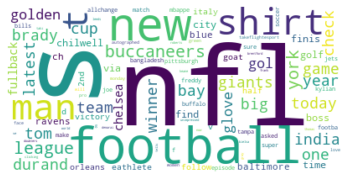

In [10]:
# Generar nube de palabras
wordcloud = WordCloud(max_words=100, background_color="white", collocations = False).generate(df['tokenized_text'].to_string())

# Mostrar gráfico
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.rcParams['figure.figsize'] = [150, 150]
plt.show()

- Eliminar las stopwords
- Generar una nueva nube de palabras

In [11]:
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))
no_stopwords_data = []
# Crear lista sin stopwords
for x in tokenized_text:
    for word in x:
        if word.lower() not in stopwords:
            no_stopwords_data.append(word)
print(no_stopwords_data)

['demarai', 'gray', 'clicking', 'everton', 'football', 'news', 'sport', 'chelsea', 'fullback', 'chilwell', 'patient', 'football', 'news', 'sport', 'brentford', 'boss', 'thomas', 'frank', 'world', 'taking', 'us', 'seriously', 'football', 'news', 'sport', 'bielsa', 'tells', 'leeds', 'doubters', 'roberts', 'taking', 'step', 'forward', 'football', 'news', 'sport', 'keane', 'unimpressed', 'man', 'city', 'midfielder', 'grealish', 'time', 'man', 'football', 'news', 'sport', 'big', 'facts', 'luckily', 'able', 'find', 'purpose', 'pretty', 'early', 'life', 'coaching', 'mentor', 'football', 'youth', 'thenextgenerations', 'family', 'chelsea', 'fullback', 'chilwell', 'happy', 'finish', 'eventful', 'southampton', 'clash', 'winner', 'football', 'news', 'sport', 'man', 'utd', 'target', 'nkunku', 'offered', 'real', 'madrid', 'zahavi', 'football', 'news', 'sport', 'southampton', 'boss', 'hasenhuttl', 'cancels', 'time', 'squad', 'football', 'news', 'sport', 'claudio', 'ranieri', 'watford', 'training', 'g

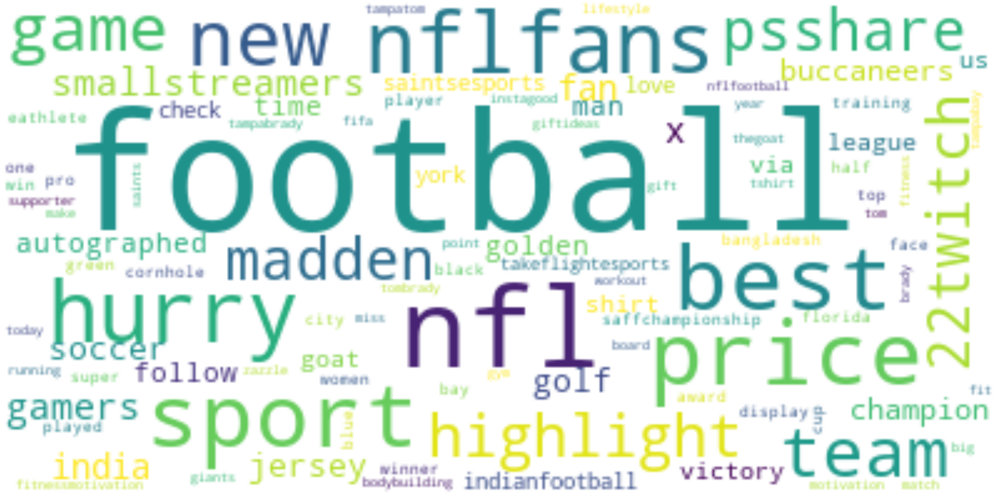

In [14]:
# Generar nube de palabras
#" ".join(map(str,test_list))
data = " ".join(map(str,no_stopwords_data))
wordcloud = WordCloud(max_words=100, background_color="white", collocations = False).generate(data)

# Mostrar gráfico
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.rcParams['figure.figsize'] = [150, 150]
plt.show()

- ¿Cómo ha cambiado el gráfico?
- ¿Ha cambiado el significado?

# ¿ Cómo ha cambiado el gráfico?

#### El nuevo gráfico tiene solo palabras claves relacionadas al #football solicitado. Se han eliminado las stop Words por lo que este gráfico es más representativo. Además el nuevo gráfico no está tan cargado visualmente hablando.
# ¿Ha cambiado el significado?

#### Si, ha cambiado el significado dado que el nuevo gráfico es más representativo en función del tema seleccionado en el hashtag.